In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from boruta import BorutaPy
from sklearn.ensemble import RandomForestClassifier

In [2]:
data = pd.read_csv('../data/bias_symptoms.csv')

## Drop high correlated features

In [3]:
corr_matrix = data.drop(columns=['variable','data']).corr(method='spearman').abs()

# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find features with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]
to_drop

['gini', 'shannon', 'ir']

In [4]:
# Drop highly correlated features
data.drop(columns=['ir', 'gini', 'shannon'], inplace=True)

In [5]:
upper

,correlation_true,mutual_info,unpriv_prob_pos,priv_prob_pos,unpriv_unbalance,priv_unbalance,statistical_parity,equal_opportunity,average_odds,kurtosis_var,skew_var,gini,simpson,shannon,ir,pos_prob
correlation_true,NaN,0.04719,0.020562,0.170485,0.076580,0.104136,0.059196,0.000649,0.024227,0.001846,0.027130,0.029018,0.041097,0.040328,0.001608,0.070296
mutual_info,NaN,NaN,0.207164,0.046202,0.122914,0.020748,0.217675,0.044620,0.142813,0.408591,0.390855,0.391368,0.379624,0.375231,0.413699,0.460071
unpriv_prob_pos,NaN,NaN,NaN,0.525928,0.184187,0.019777,0.028397,0.205969,0.073856,0.177342,0.081086,0.073204,0.782998,0.782190,0.181349,0.141159
priv_prob_pos,NaN,NaN,NaN,NaN,0.414668,0.795196,0.054311,0.062354,0.254061,0.211710,0.195376,0.199258,0.511936,0.511054,0.214813,0.043832
unpriv_unbalance,NaN,NaN,NaN,NaN,NaN,0.686685,0.008913,0.021037,0.074307,0.068407,0.034582,0.046011,0.041196,0.041450,0.068045,0.000337
priv_unbalance,NaN,NaN,NaN,NaN,NaN,NaN,0.070910,0.009160,0.271526,0.146986,0.162216,0.163111,0.141243,0.140502,0.148645,0.105530
statistical_parity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.363686,0.458379,0.380061,0.315416,0.304446,0.010539,0.014048,0.374033,0.645389
equal_opportunity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.152324,0.502269,0.460952,0.459998,0.169069,0.172906,0.496463,0.561256
average_odds,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.250177,0.178397,0.171739,0.110260,0.107192,0.251475,0.352691
kurtosis_var,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.875786,0.870316,0.406869,0.399132,0.998863,0.463996


## Feature selection with Boruta

In [6]:
rf = RandomForestClassifier(n_jobs=-1, class_weight="balanced", max_depth=5)
feat_sel = BorutaPy(rf, n_estimators="auto", verbose=2)
feat_sel.fit(
    data.drop(
        columns=[
            "statistical_parity",
            "equal_opportunity",
            "average_odds",
            "data",
            "variable",
        ]
    ).values,
    data["statistical_parity"].values,
)
new_x = feat_sel.transform(
    data.drop(
        columns=[
            "statistical_parity",
            "equal_opportunity",
            "average_odds",
            "data",
            "variable",
        ]
    ).values
)

Iteration: 	1 / 100
Confirmed: 	0
Tentative: 	10
Rejected: 	0
Iteration: 	2 / 100
Confirmed: 	0
Tentative: 	10
Rejected: 	0
Iteration: 	3 / 100
Confirmed: 	0
Tentative: 	10
Rejected: 	0
Iteration: 	4 / 100
Confirmed: 	0
Tentative: 	10
Rejected: 	0
Iteration: 	5 / 100
Confirmed: 	0
Tentative: 	10
Rejected: 	0
Iteration: 	6 / 100
Confirmed: 	0
Tentative: 	10
Rejected: 	0
Iteration: 	7 / 100
Confirmed: 	0
Tentative: 	10
Rejected: 	0
Iteration: 	8 / 100
Confirmed: 	10
Tentative: 	0
Rejected: 	0


BorutaPy finished running.

Iteration: 	9 / 100
Confirmed: 	10
Tentative: 	0
Rejected: 	0


## Correlation between SP and Abs Prob

In [7]:
data.loc[:,'statistical_parity'] = data['statistical_parity'].abs()

In [8]:
data[['statistical_parity', 'pos_prob']].corr(method='kendall')

,statistical_parity,pos_prob
statistical_parity,1.000000,0.527275
pos_prob,0.527275,1.000000


<Axes: ylabel='pos_prob'>

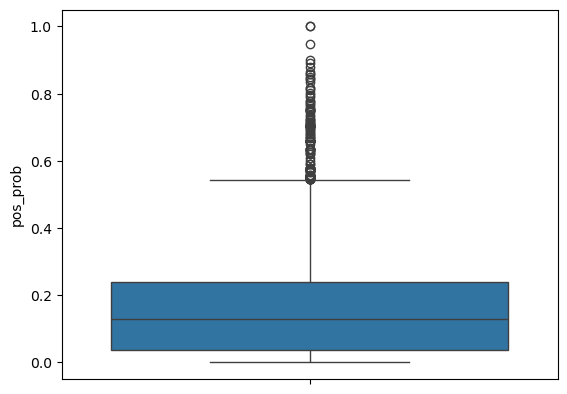

In [38]:
sns.boxplot(data=data, y='pos_prob')

<Axes: ylabel='statistical_parity'>

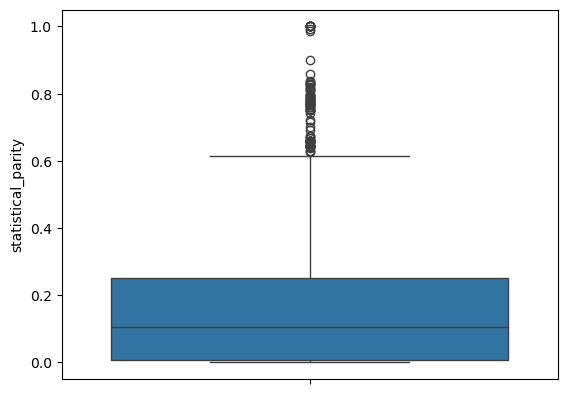

In [39]:
sns.boxplot(data=data, y='statistical_parity')

pos_prob    Axes(0.125,0.11;0.775x0.77)
dtype: object

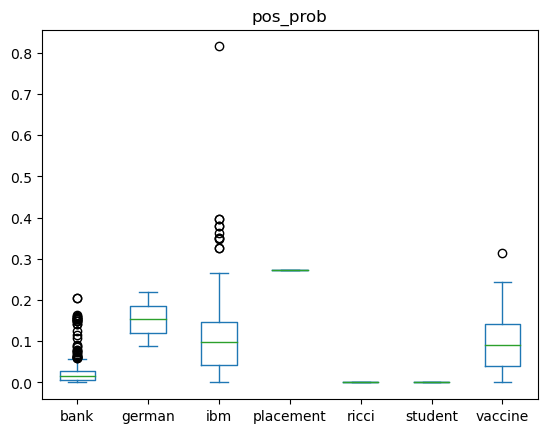

In [59]:
data[data["statistical_parity"] == 0][["data", "pos_prob"]].plot(kind="box", by="data")

In [44]:
data[(data['data'] == 'medical') & (data['statistical_parity'] == 0)]

,variable,data,correlation_true,mutual_info,unpriv_prob_pos,priv_prob_pos,unpriv_unbalance,priv_unbalance,statistical_parity,equal_opportunity,average_odds,kurtosis_var,skew_var,gini,simpson,shannon,ir,pos_prob
4894,CDecomp,medical,1.000000,0.636514,1.00,0.0,1.500000,0.000000,0.0,-0.333333,0.000000,-1.714286,0.857143,0.093598,0.711111,0.999999,0.499951,1.00
4896,outpatient,medical,-1.000000,0.636514,0.00,1.0,0.000000,1.500000,0.0,0.333333,0.000000,-1.714286,-0.857143,0.074631,0.711111,0.999999,0.499951,1.00
4942,PDecomp,medical,0.577350,0.215762,1.00,0.5,1.333333,0.666667,0.0,-0.500000,-0.375000,-2.800000,0.000000,0.084115,1.000000,1.000000,1.000000,0.50
4947,PDecomp,medical,0.377964,0.095603,0.25,0.0,2.000000,0.000000,0.0,-0.250000,0.458333,-2.800000,0.000000,0.084115,1.000000,1.000000,1.000000,0.25


## Distribution of Symptoms for each dataset

In [69]:
datasets = data['data'].unique()
datasets

array(['arrhythmia', 'bank', 'cmc', 'crime', 'diabetic', 'drug', 'german',
       'health', 'hearth', 'ibm', 'law', 'obesity', 'park', 'placement',
       'ricci', 'student', 'us', 'vaccine', 'wine'], dtype=object)

In [70]:
melt_data = data.melt(id_vars=['data', 'variable'], value_name='value', var_name='symptom')

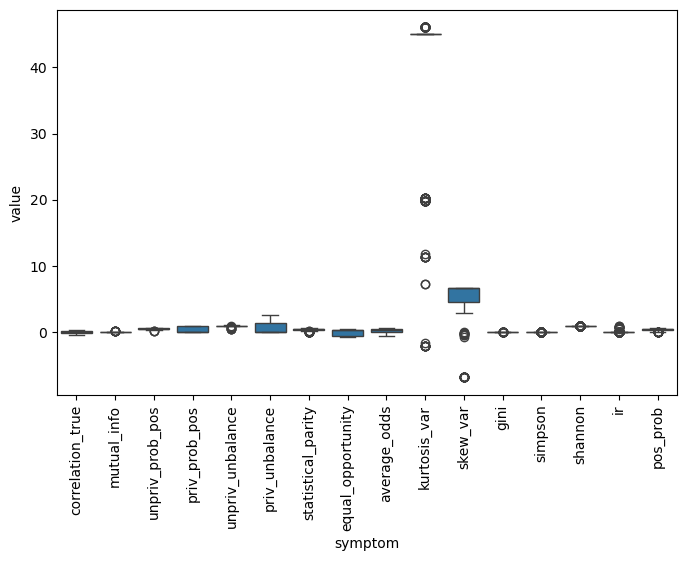

In [74]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.boxplot(data=melt_data[melt_data['data'] == 'arrhythmia'], x='symptom', y='value', ax=ax)
plt.xticks(rotation=90)
plt.show()

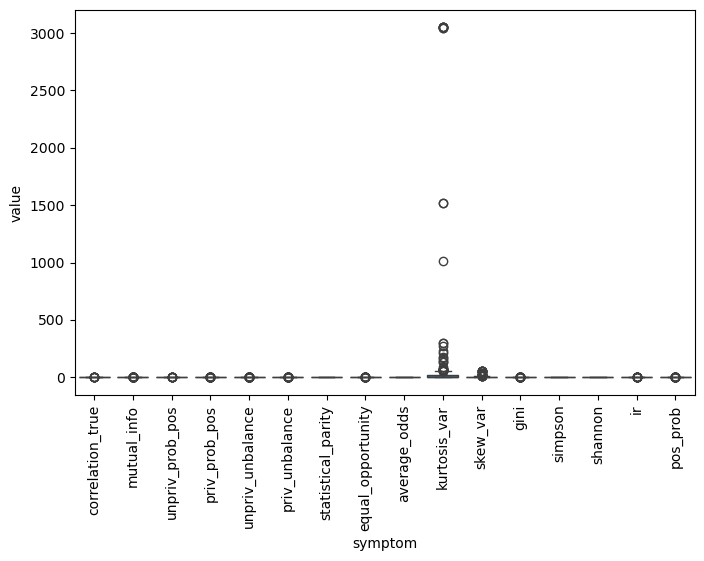

In [75]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.boxplot(
    data=melt_data[melt_data["data"] == "bank"], x="symptom", y="value", ax=ax
)
plt.xticks(rotation=90)
plt.show()

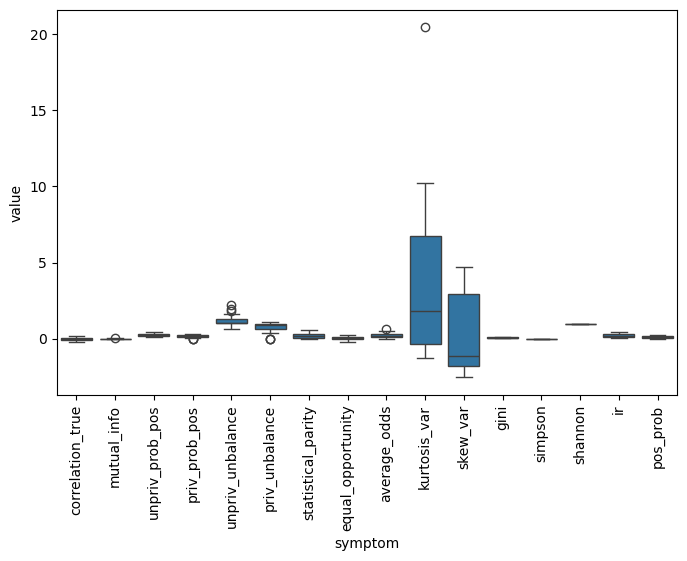

In [76]:
fig, ax = plt.subplots(figsize=(8, 5))
sns.boxplot(
    data=melt_data[melt_data["data"] == "cmc"], x="symptom", y="value", ax=ax
)
plt.xticks(rotation=90)
plt.show()

## Distribution of Bias Metric values for each dataset

In [4]:
data_class = pd.read_csv('../data/bias_symptoms.csv')
data_class.head()

,variable,data,correlation_true,mutual_info,unpriv_prob_pos,priv_prob_pos,unpriv_unbalance,priv_unbalance,statistical_parity,equal_opportunity,average_odds,kurtosis_var,skew_var,gini,simpson,shannon,ir,pos_prob
0,race,adult,0.084531,0.004036,0.129252,0.252500,0.536785,1.048638,0.0,0.0,1.0,5.639858,-2.763370,0.061071,0.000004,0.992166,0.104912,0.123248
1,sex,adult,0.230065,0.029482,0.101744,0.310378,0.422546,1.289007,0.0,0.0,0.0,-1.501940,-0.706421,0.074643,0.000006,0.992493,0.500436,0.208634
2,10th,adult,-0.079627,0.004225,0.246914,0.051546,1.025437,0.214073,0.0,0.0,1.0,26.974784,5.381203,0.110781,0.000004,0.991988,0.032271,0.195367
3,11th,adult,-0.091252,0.005677,0.248489,0.043103,1.031979,0.179009,0.0,0.0,1.0,21.748435,4.871794,0.110432,0.000004,0.992009,0.038858,0.205385
4,12th,adult,-0.051403,0.001712,0.243518,0.063830,1.011336,0.265086,0.0,0.0,1.0,60.945596,7.931343,0.111701,0.000003,0.991927,0.015328,0.179688


<Axes: xlabel='data,statistical_parity'>

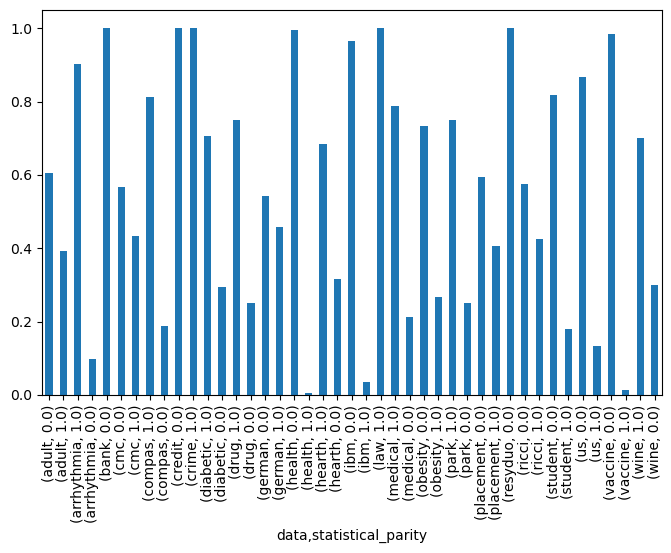

In [10]:
data_class.drop(columns='variable').groupby('data')[['statistical_parity']].value_counts(normalize=True).plot(kind='bar', figsize=(8, 5), x='data')

<Axes: xlabel='data,equal_opportunity'>

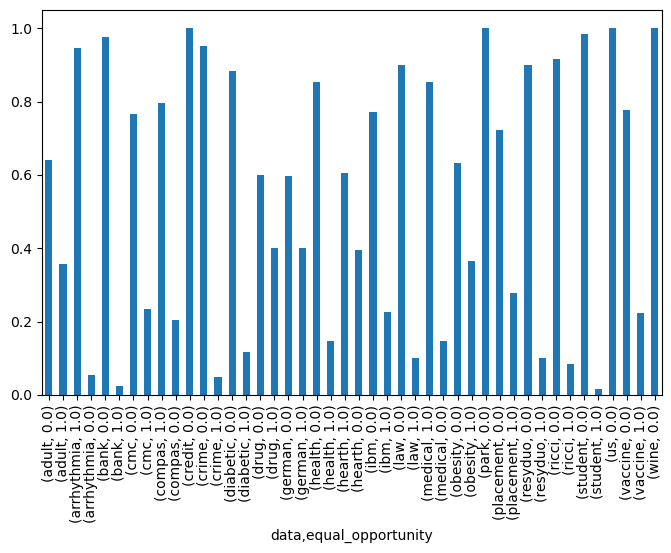

In [11]:
data_class.drop(columns="variable").groupby("data")[
    ["equal_opportunity"]
].value_counts(normalize=True).plot(kind="bar", figsize=(8, 5), x="data")

<Axes: xlabel='data,average_odds'>

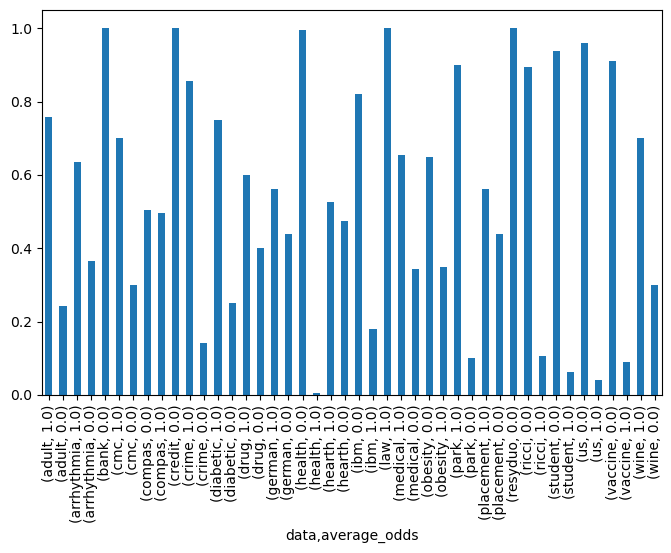

In [12]:
data_class.drop(columns="variable").groupby("data")[
    ["average_odds"]
].value_counts(normalize=True).plot(kind="bar", figsize=(8, 5), x="data")

## Extract Decision Rules

In [14]:
import joblib
from sklearn.tree import export_text

rf = joblib.load("../../ml_models/bias_symptoms_rf.joblib")

In [4]:
data.drop(
    columns=["statistical_parity", "equal_opportunity", "average_odds"]
).columns.tolist()

['variable',
 'data',
 'correlation_true',
 'mutual_info',
 'unpriv_prob_pos',
 'priv_prob_pos',
 'unpriv_unbalance',
 'priv_unbalance',
 'kurtosis_var',
 'skew_var',
 'gini',
 'simpson',
 'shannon',
 'ir',
 'pos_prob']

In [91]:
all_rules = []
for i, tree in enumerate(rf.estimators_):
    rules = export_text(tree, feature_names=data.drop(columns=['variable', 'data', 'statistical_parity', 'equal_opportunity', 'average_odds']).columns.tolist())
    all_rules.append(rules)
    print(f"Tree {i} rules:\n{rules}\n")

Tree 0 rules:
|--- priv_prob_pos <= 0.00
|   |--- simpson <= 0.00
|   |   |--- unpriv_unbalance <= 1.00
|   |   |   |--- ir <= 0.00
|   |   |   |   |--- shannon <= 0.97
|   |   |   |   |   |--- mutual_info <= 0.00
|   |   |   |   |   |   |--- shannon <= 0.97
|   |   |   |   |   |   |   |--- mutual_info <= 0.00
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |--- mutual_info >  0.00
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- shannon >  0.97
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- mutual_info >  0.00
|   |   |   |   |   |   |--- unpriv_prob_pos <= 0.22
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |--- unpriv_prob_pos >  0.22
|   |   |   |   |   |   |   |--- skew_var <= 86.10
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |   |   |--- skew_var >  86.10
|   |   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- shannon >  0.97
|   |   |   |   |   |--- class: 

# Dimensionality Reduction

In [46]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca.fit(data.drop(columns=['variable', 'data', 'statistical_parity', 'equal_opportunity', 'average_odds']))
pca_data = pca.transform(data.drop(columns=['variable', 'data', 'statistical_parity', 'equal_opportunity', 'average_odds']))

In [47]:
pca_data.shape

(5930, 2)

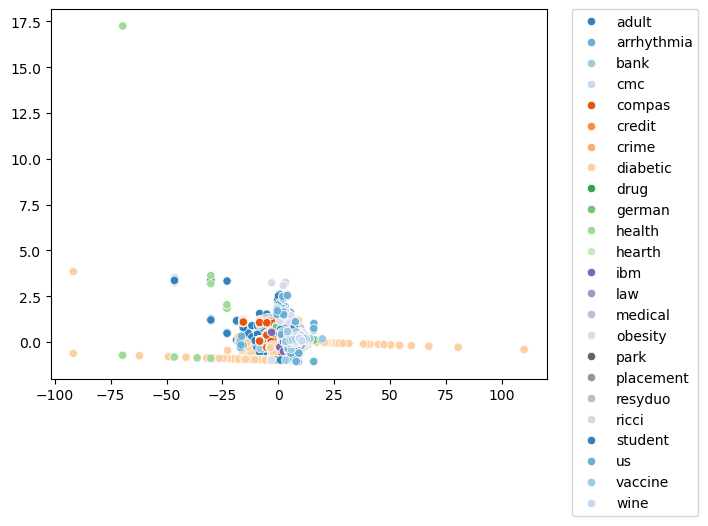

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.scatterplot(x=pca_data[:, 0], y=pca_data[:, 1], hue=data['data'], palette='tab20c')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

In [49]:
pca_data.shape

(5930, 2)

In [50]:
data["data"]

0       adult
1       adult
2       adult
3       adult
4       adult
        ...  
5925     wine
5926     wine
5927     wine
5928     wine
5929     wine
Name: data, Length: 5930, dtype: object

In [51]:
pca_df = pd.DataFrame(pca_data, columns=['pca1', 'pca2'])
pca_df['data'] = data['data'] 

In [52]:
pca_df = pca_df[pca_df['data'] != 'diabetic']

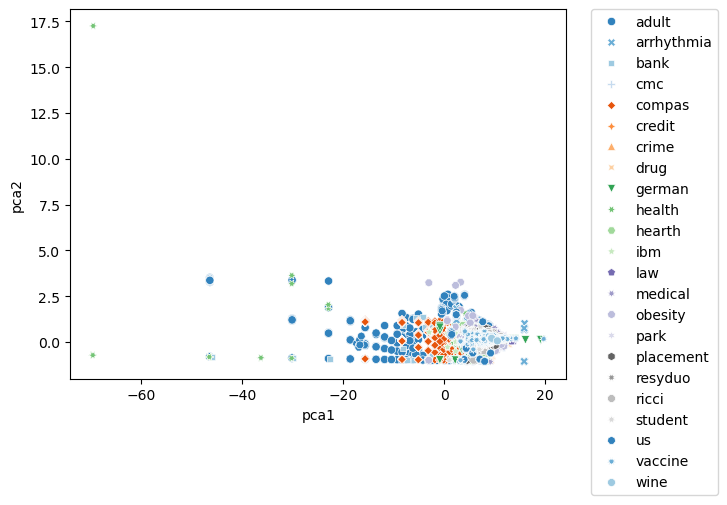

In [53]:
sns.scatterplot(x='pca1', y='pca2', style='data', hue='data', data=pca_df, palette='tab20c')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

In [54]:
pca_df = pca_df[(pca_df['data'] != 'health') & (pca_df['data'] != 'hearth')]

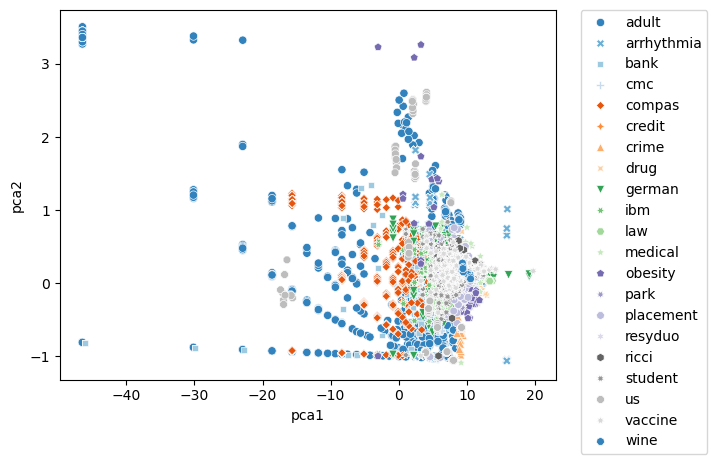

In [55]:
sns.scatterplot(
    x="pca1", y="pca2", style="data", hue="data", data=pca_df, palette="tab20c"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

In [58]:
pca_df = pca_df[pca_df['data'] != 'adult']

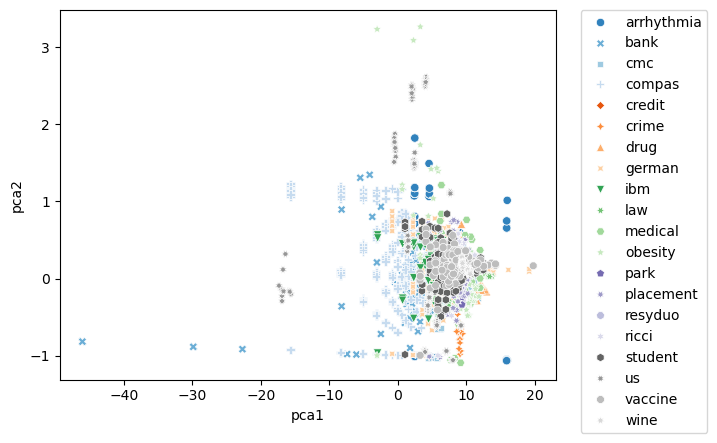

In [59]:
sns.scatterplot(
    x="pca1", y="pca2", style="data", hue="data", data=pca_df, palette="tab20c"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

In [60]:
pca_df = pca_df[pca_df['data'] != 'bank']

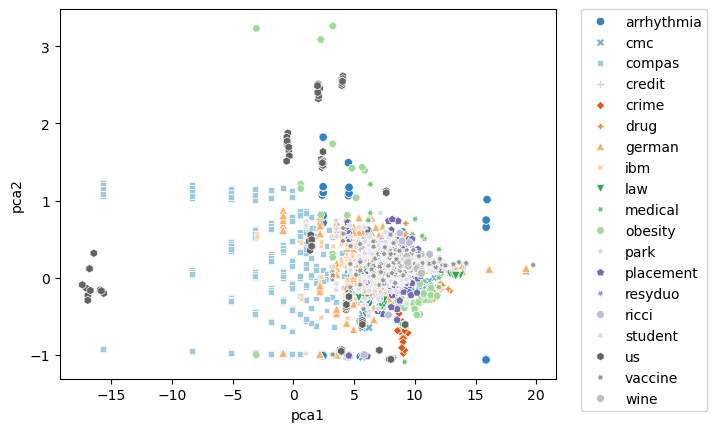

In [61]:
sns.scatterplot(
    x="pca1", y="pca2", style="data", hue="data", data=pca_df, palette="tab20c"
)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0)
plt.show()

In [ ]:
pca_df

,pca1,pca2,data
902,-361.831075,6.884425,arrhythmia
903,-339.466173,2.130211,arrhythmia
904,-313.766681,0.159149,arrhythmia
905,-313.766681,0.159162,arrhythmia
906,-313.766681,0.159172,arrhythmia
...,...,...,...
5925,-360.795819,7.629820,wine
5926,-361.730186,6.913852,wine
5927,-359.874710,8.017571,wine
5928,-361.756147,6.867233,wine


In [5]:
data_class = pd.read_csv('../data/bias_symptoms.csv')
data_class = data_class[data_class['data'].isin(pca_df['data'])]

NameError: name 'pca_df' is not defined

# Decision Tree Selection

In [6]:
from sklearn.tree import DecisionTreeClassifier

model = DecisionTreeClassifier()
data_class = pd.read_csv("../data/bias_symptoms.csv")

In [9]:
train_set = ['arrhythmia', 'cmc', 'compas', 'credit', 'crime', 'drug', 'german', 'ibm']

train_data = data_class[data_class['data'].isin(train_set)]
train_data

,variable,data,correlation_true,mutual_info,unpriv_prob_pos,priv_prob_pos,unpriv_unbalance,priv_unbalance,statistical_parity,equal_opportunity,average_odds,kurtosis_var,skew_var,gini,simpson,shannon,ir,pos_prob
902,1,arrhythmia,-0.329830,0.263048,0.250000,0.576923,0.575000,1.326923,0.0,0.0,0.0,-2.015633,-0.272071,0.080404,0.029740,0.999956,0.769208,0.326923
903,23,arrhythmia,0.071520,0.075555,0.454545,0.000000,1.045455,0.000000,1.0,1.0,1.0,20.315083,4.629568,0.110091,0.016495,0.999949,0.045361,0.454545
904,24,arrhythmia,0.152653,0.042323,0.444444,0.000000,1.022222,0.000000,1.0,1.0,1.0,46.000000,6.782330,0.111328,0.015795,0.999947,0.022126,0.444444
905,26,arrhythmia,0.021056,0.055834,0.444444,0.000000,1.022222,0.000000,1.0,1.0,1.0,46.000000,6.782330,0.111328,0.015795,0.999947,0.022126,0.444444
906,38,arrhythmia,0.110542,0.104732,0.444444,0.000000,1.022222,0.000000,1.0,1.0,1.0,46.000000,6.782330,0.111328,0.015795,0.999947,0.022126,0.444444
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4833,MaritalStatus_Divorced,ibm,-0.095871,0.005095,0.798319,0.892857,0.977941,1.093750,0.0,0.0,0.0,0.544168,1.592781,0.101727,0.002141,0.999786,0.235219,0.094538
4834,MaritalStatus_Married,ibm,-0.058910,0.001746,0.794872,0.840580,0.973718,1.029710,0.0,0.0,0.0,-2.012203,0.123947,0.085857,0.002951,0.999796,0.884604,0.045708
4835,MaritalStatus_Single,ibm,0.141521,0.009645,0.855670,0.740000,1.048196,0.906500,0.0,0.0,0.0,-1.556434,0.681858,0.093211,0.002687,0.999794,0.515416,0.115670
4836,OverTime_No,ibm,-0.306588,0.044253,0.645833,0.898990,0.791146,1.101263,0.0,1.0,0.0,-1.461345,-0.747479,0.074244,0.002644,0.999793,0.484798,0.253157


In [10]:
test_data = data_class[~data_class['data'].isin(train_set)]
test_data

,variable,data,correlation_true,mutual_info,unpriv_prob_pos,priv_prob_pos,unpriv_unbalance,priv_unbalance,statistical_parity,equal_opportunity,average_odds,kurtosis_var,skew_var,gini,simpson,shannon,ir,pos_prob
0,race,adult,0.084531,0.004036,0.129252,0.252500,0.536785,1.048638,0.0,0.0,1.0,5.639858,-2.763370,0.061071,0.000004,0.992166,0.104912,0.123248
1,sex,adult,0.230065,0.029482,0.101744,0.310378,0.422546,1.289007,0.0,0.0,0.0,-1.501940,-0.706421,0.074643,0.000006,0.992493,0.500436,0.208634
2,10th,adult,-0.079627,0.004225,0.246914,0.051546,1.025437,0.214073,0.0,0.0,1.0,26.974784,5.381203,0.110781,0.000004,0.991988,0.032271,0.195367
3,11th,adult,-0.091252,0.005677,0.248489,0.043103,1.031979,0.179009,0.0,0.0,1.0,21.748435,4.871794,0.110432,0.000004,0.992009,0.038858,0.205385
4,12th,adult,-0.051403,0.001712,0.243518,0.063830,1.011336,0.265086,0.0,0.0,1.0,60.945596,7.931343,0.111701,0.000003,0.991927,0.015328,0.179688
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5925,type,wine,0.085865,0.005864,0.384615,0.476510,0.852241,1.055864,0.0,0.0,0.0,-0.975126,-1.013928,0.071275,0.000140,0.998825,0.378015,0.091895
5926,alcohol,wine,0.363793,0.081020,0.404580,0.497175,0.883764,1.086028,1.0,0.0,1.0,-1.914522,-0.302827,0.079866,0.000165,0.998844,0.740087,0.092595
5927,type,wine,0.142046,0.013685,0.416667,0.469008,0.910165,1.024500,1.0,0.0,1.0,-0.051297,-1.396023,0.067857,0.000127,0.998811,0.272656,0.052342
5928,alcohol,wine,0.374326,0.090288,0.379182,0.512968,0.834201,1.128530,1.0,0.0,1.0,-1.940814,-0.255925,0.080512,0.000166,0.998844,0.775194,0.133786


In [127]:
# Statistical parity

features = train_data.drop(columns=['statistical_parity', 'equal_opportunity', 'average_odds', 'data', 'variable'])
target = train_data['statistical_parity']
model.fit(features, target)

DecisionTreeClassifier()

In [128]:
from sklearn.metrics import matthews_corrcoef, f1_score, accuracy_score

test_features = test_data.drop(columns=['statistical_parity', 'equal_opportunity', 'average_odds', 'data', 'variable'])
test_target = test_data['statistical_parity']
test_pred = model.predict(test_features)
f1_score(test_target, test_pred)

0.5405405405405405

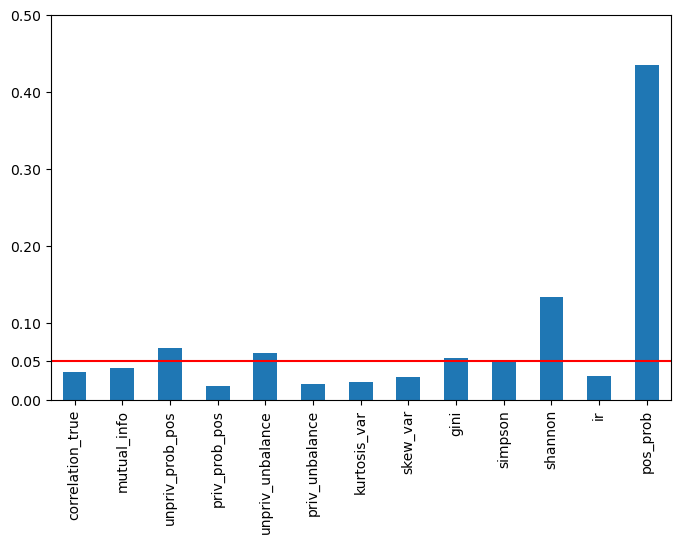

In [129]:
# feature importance
importances = model.feature_importances_

fig, ax = plt.subplots(figsize=(8, 5))
pd.DataFrame(importances, index=features.columns).plot.bar(ax=ax, legend=False)
plt.axhline(y=0.05, color='r', linestyle='-')
yticks = ax.get_yticks()
yticks = np.append(yticks, 0.05)
ax.set_yticks(yticks)
plt.show()


In [131]:
features = features[
    [
        "unpriv_prob_pos",
        "unpriv_unbalance",
        "gini",
        "shannon",
        "pos_prob"
    ]
]
test_features = test_features[
    [
        "unpriv_prob_pos",
        "unpriv_unbalance",
        "gini",
        "shannon",
        "pos_prob",
    ]
]

In [133]:
model.fit(features, target)

DecisionTreeClassifier()

In [134]:
preds = model.predict(test_features)
f1_score(test_target, preds)

0.41608876560332875

In [135]:
from sklearn.tree import export_text

rules = export_text(model, feature_names=features.columns.tolist())
print(rules)

|--- pos_prob <= 0.25
|   |--- shannon <= 1.00
|   |   |--- shannon <= 1.00
|   |   |   |--- gini <= 0.11
|   |   |   |   |--- pos_prob <= 0.09
|   |   |   |   |   |--- class: 0.0
|   |   |   |   |--- pos_prob >  0.09
|   |   |   |   |   |--- gini <= 0.11
|   |   |   |   |   |   |--- gini <= 0.11
|   |   |   |   |   |   |   |--- unpriv_prob_pos <= 0.57
|   |   |   |   |   |   |   |   |--- class: 0.0
|   |   |   |   |   |   |   |--- unpriv_prob_pos >  0.57
|   |   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |   |--- gini >  0.11
|   |   |   |   |   |   |   |--- unpriv_prob_pos <= 0.53
|   |   |   |   |   |   |   |   |--- class: 0.0
|   |   |   |   |   |   |   |--- unpriv_prob_pos >  0.53
|   |   |   |   |   |   |   |   |--- class: 1.0
|   |   |   |   |   |--- gini >  0.11
|   |   |   |   |   |   |--- class: 0.0
|   |   |   |--- gini >  0.11
|   |   |   |   |--- unpriv_unbalance <= 0.99
|   |   |   |   |   |--- class: 1.0
|   |   |   |   |--- unpriv_unbalance >  0.99
|   